In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
from PIL import Image, ImageDraw

In [4]:
import math

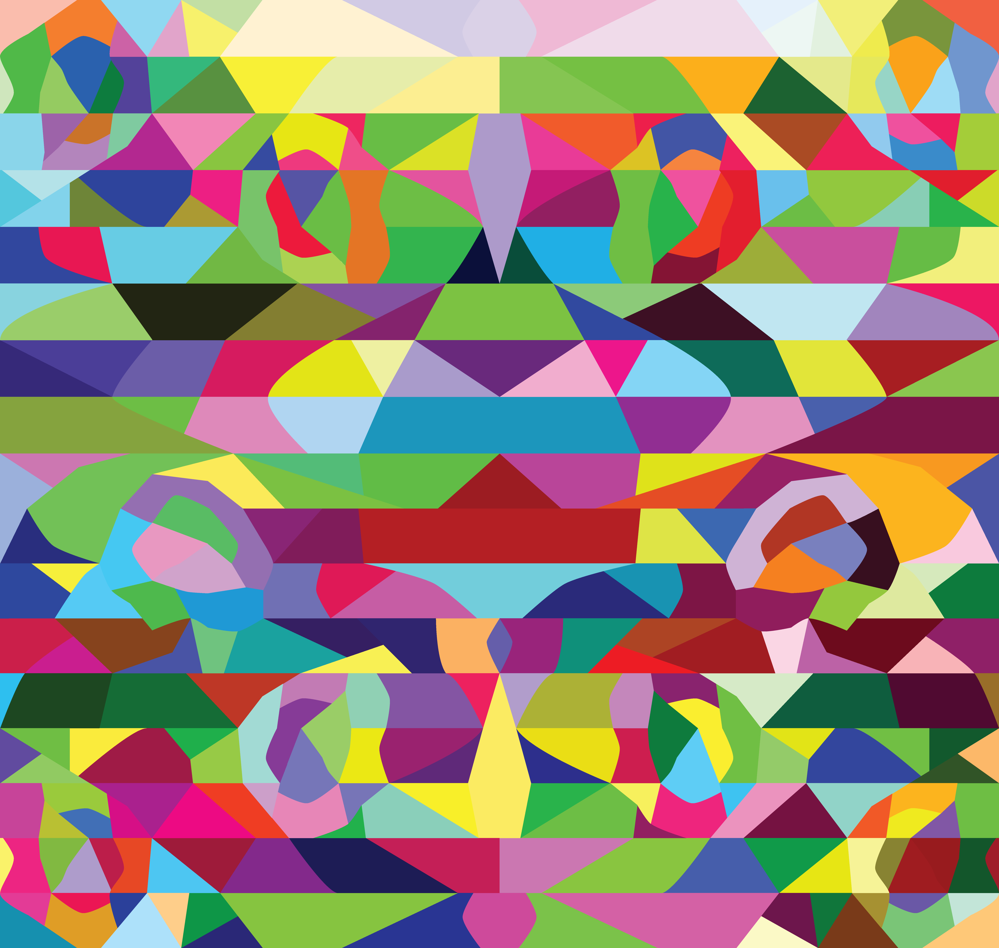

In [5]:
design = Image.open("../assets/glass/glass-ids.png")
display(design)

In [6]:
h = design.height
w = design.width

In [7]:
segments = 17
led_across = 141
led_up = 9

# Y position of each segment in design pixels from top, since they aren't all exactly
# the same :(
segment_spacings = [
    0,
    389,
    776,
    1166,
    1553,
    1941,
    2328,
    2717,
    3104,
    3478,
    3858,
    4235,
    4609,
    4986,
    5362,
    5738,
    6115
]

In [8]:
for x,y in zip(segment_spacings[:-1], segment_spacings[1:]):
        print(y-x)

389
387
390
387
388
387
389
387
374
380
377
374
377
376
376
377


In [9]:
segment_spacing = h / segments
across_spacing = w / led_across
up_spacing = segment_spacing / led_up

In [10]:
colors = design.getcolors(maxcolors=100000)
len(colors)

330

In [11]:
# Indexed from top left corner
# Probably need to do some flipping to match the model
# Car LEDs go anticlockwise from top, back corner.
# TODO: we aren't adapting up_spacing to the width of each segment

led_coord = []
first_coord = []

ids = {}
neighbours = {}

def addn(poly, targets):
    print(poly)
    color = design.getpixel(poly)
    
    if color not in neighbours:
        neighbours[color] = set()
                
    for neighbour in targets:
        x, y = neighbour
        
        if x < 0 or x >= w:
            continue
            
        if y < 0 or y >= h:
            continue
                                    
        neighbours[color].add(design.getpixel(neighbour))
    
for seg, space in enumerate(segment_spacings):
    x = w - across_spacing / 2.0
    y = math.floor(space + up_spacing * (led_up-1) + up_spacing / 2.0)
    
    sign = 1 # Starting at bottom on image
    
    if seg >= 8:
        # We're now on the front side, put the origin in the right place
        sign = -1 # Starting segment at top on image
#         y = segment_spacings[seg] if seg < len(segment_spacings)-1 else h
        y = space + up_spacing / 2.0
    
    first_coord.append((x,y))

    # Right to left
    for i in range(led_across):
        led_coord.append((x,y))
        addn((x,y), [(x - across_spacing, y), (x + across_spacing, y), (x, y - (up_spacing-1) * led_up * sign)])
        x -= across_spacing
        
    # Up
    x += across_spacing*0.75
    for i in range(led_up):
        led_coord.append((x, y))
        y -= up_spacing * sign
        
    # Left to right
    x += across_spacing*0.25
    y += up_spacing * sign
    for i in range(led_across):
        led_coord.append((x,y))
        addn((x,y), [(x - across_spacing, y), (x + across_spacing, y), (x, y + (up_spacing-1) * led_up * sign)])
        x += across_spacing

    # Down
    x -= across_spacing*0.75
    for i in range(led_up):
        led_coord.append((x,y))
        y += up_spacing * sign
        

(6816.741134751773, 360)
(6768.223404255319, 360)
(6719.7056737588655, 360)
(6671.187943262412, 360)
(6622.670212765958, 360)
(6574.152482269505, 360)
(6525.634751773051, 360)
(6477.117021276597, 360)
(6428.599290780144, 360)
(6380.08156028369, 360)
(6331.5638297872365, 360)
(6283.046099290783, 360)
(6234.528368794329, 360)
(6186.010638297876, 360)
(6137.492907801422, 360)
(6088.975177304968, 360)
(6040.457446808515, 360)
(5991.939716312061, 360)
(5943.4219858156075, 360)
(5894.904255319154, 360)
(5846.3865248227, 360)
(5797.868794326247, 360)
(5749.351063829793, 360)
(5700.833333333339, 360)
(5652.315602836886, 360)
(5603.797872340432, 360)
(5555.2801418439785, 360)
(5506.762411347525, 360)
(5458.244680851071, 360)
(5409.726950354618, 360)
(5361.209219858164, 360)
(5312.69148936171, 360)
(5264.173758865257, 360)
(5215.656028368803, 360)
(5167.1382978723495, 360)
(5118.620567375896, 360)
(5070.102836879442, 360)
(5021.585106382989, 360)
(4973.067375886535, 360)
(4924.549645390081, 360)

(654.9893617021369, 2301)
(606.471631205683, 2301)
(557.9539007092292, 2301)
(509.43617021277527, 2301)
(460.91843971632136, 2301)
(412.40070921986745, 2301)
(363.88297872341354, 2301)
(315.36524822695964, 2301)
(266.84751773050573, 2301)
(218.32978723405182, 2301)
(169.8120567375979, 2301)
(121.294326241144, 2301)
(72.7765957446901, 2301)
(24.258865248236198, 2301)
(24.258865248236198, 1961.7058823529405)
(72.7765957446901, 1961.7058823529405)
(121.294326241144, 1961.7058823529405)
(169.8120567375979, 1961.7058823529405)
(218.32978723405182, 1961.7058823529405)
(266.84751773050573, 1961.7058823529405)
(315.36524822695964, 1961.7058823529405)
(363.88297872341354, 1961.7058823529405)
(412.40070921986745, 1961.7058823529405)
(460.91843971632136, 1961.7058823529405)
(509.43617021277527, 1961.7058823529405)
(557.9539007092292, 1961.7058823529405)
(606.471631205683, 1961.7058823529405)
(654.9893617021369, 1961.7058823529405)
(703.5070921985907, 1961.7058823529405)
(752.0248226950446, 1961.7

(3371.9822695035587, 3879.205882352941)
(3323.4645390071046, 3879.205882352941)
(3274.9468085106505, 3879.205882352941)
(3226.4290780141964, 3879.205882352941)
(3177.9113475177423, 3879.205882352941)
(3129.3936170212883, 3879.205882352941)
(3080.875886524834, 3879.205882352941)
(3032.35815602838, 3879.205882352941)
(2983.840425531926, 3879.205882352941)
(2935.322695035472, 3879.205882352941)
(2886.804964539018, 3879.205882352941)
(2838.287234042564, 3879.205882352941)
(2789.7695035461097, 3879.205882352941)
(2741.2517730496556, 3879.205882352941)
(2692.7340425532016, 3879.205882352941)
(2644.2163120567475, 3879.205882352941)
(2595.6985815602934, 3879.205882352941)
(2547.1808510638393, 3879.205882352941)
(2498.6631205673852, 3879.205882352941)
(2450.145390070931, 3879.205882352941)
(2401.627659574477, 3879.205882352941)
(2353.109929078023, 3879.205882352941)
(2304.592198581569, 3879.205882352941)
(2256.074468085115, 3879.205882352941)
(2207.556737588661, 3879.205882352941)
(2159.0390070

(946.09574468086, 6098.499999999997)
(994.6134751773138, 6098.499999999997)
(1043.1312056737677, 6098.499999999997)
(1091.6489361702215, 6098.499999999997)
(1140.1666666666754, 6098.499999999997)
(1188.6843971631292, 6098.499999999997)
(1237.202127659583, 6098.499999999997)
(1285.719858156037, 6098.499999999997)
(1334.2375886524908, 6098.499999999997)
(1382.7553191489446, 6098.499999999997)
(1431.2730496453985, 6098.499999999997)
(1479.7907801418523, 6098.499999999997)
(1528.3085106383062, 6098.499999999997)
(1576.82624113476, 6098.499999999997)
(1625.343971631214, 6098.499999999997)
(1673.8617021276677, 6098.499999999997)
(1722.3794326241216, 6098.499999999997)
(1770.8971631205754, 6098.499999999997)
(1819.4148936170293, 6098.499999999997)
(1867.9326241134831, 6098.499999999997)
(1916.450354609937, 6098.499999999997)
(1964.9680851063908, 6098.499999999997)
(2013.4858156028447, 6098.499999999997)
(2062.0035460992985, 6098.499999999997)
(2110.5212765957526, 6098.499999999997)
(2159.0390

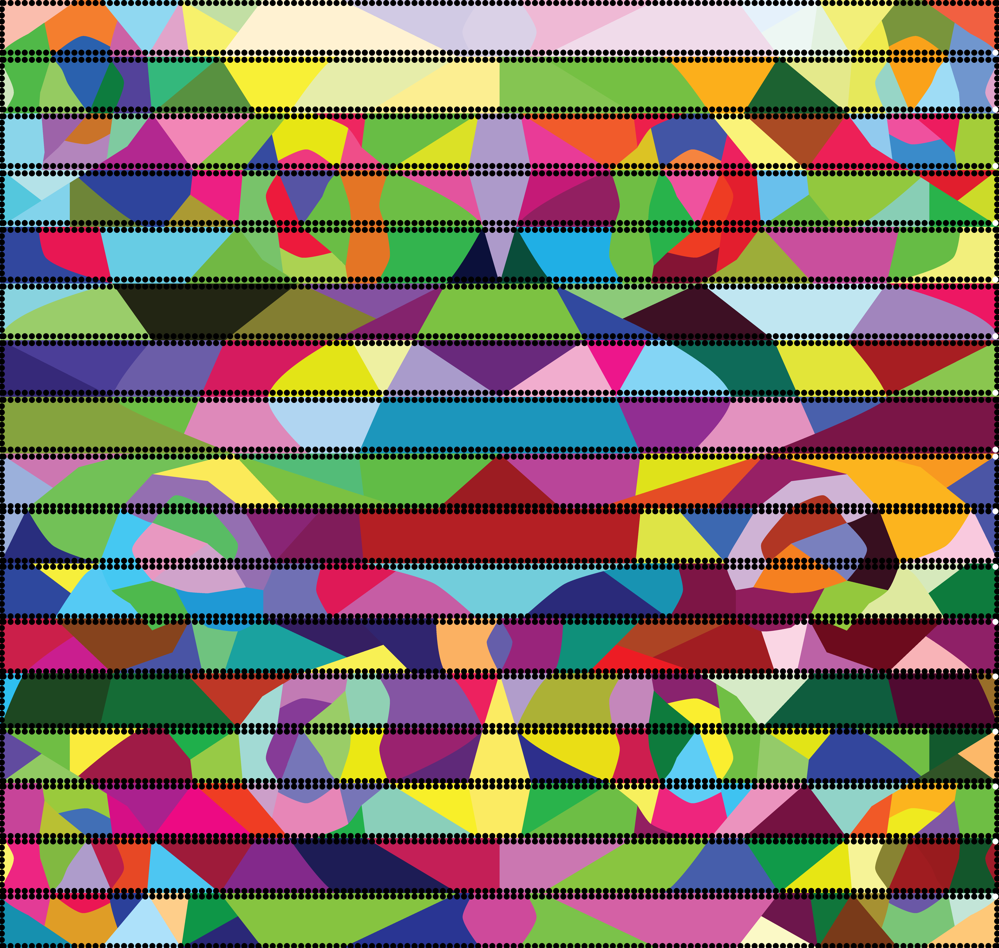

In [12]:
leds = Image.new(design.mode, (design.width, design.height), color=(0,0,0,0))
draw = ImageDraw.Draw(leds)


for x,y in led_coord:
    draw.ellipse([x-20, y-20, x+20, y+20], fill=(0,0,0))

for x,y in first_coord:
    draw.ellipse([x-20, y-20, x+20, y+20], fill=(255,255,255))
    
display(Image.alpha_composite(design, leds))

In [13]:
# Dicts are now ordered, so polygon ids should be in
# approximately left-right, top-bottom order.

ids = {}

for i, (x,y) in enumerate(led_coord):
    color = design.getpixel((x,y))
    if color not in ids:
        ids[color] = list()
    
    ids[color].append(i)

In [14]:
neighbour_ids = []
ids_keys = [x for x in ids.keys()]

for i, (k, v) in enumerate(neighbours.items()): 
    polys = list()
    for neighbour in v:
        index = ids_keys.index(neighbour)
        
        # Avoid loops
        if index != i: 
            polys.append(index)
        
    neighbour_ids.append(polys)

In [15]:
neighbour_ids

[[40, 23, 70, 1, 13],
 [0, 22, 4, 2],
 [23, 70, 25, 3, 1, 69, 24],
 [2, 4],
 [5, 25, 26, 3, 1, 2],
 [6, 4, 26, 21],
 [7, 5],
 [6, 8, 21, 29, 28],
 [30, 7, 9, 29],
 [31, 30, 10, 8],
 [31, 11, 9, 32],
 [33, 10, 20, 12, 32],
 [11, 13],
 [35, 0, 20, 12, 14],
 [16, 36, 35, 17, 15, 13],
 [14, 16],
 [64, 36, 38, 17, 37, 15, 63],
 [16, 18, 19, 14],
 [38, 17, 62, 39, 63],
 [17, 18, 16],
 [33, 35, 11, 13],
 [5, 7, 26, 28],
 [2, 0, 1],
 [70, 2, 0],
 [2, 3, 25],
 [2, 26, 3, 24, 68],
 [43, 5, 25, 28, 27],
 [5, 6, 7, 26, 28],
 [44, 43, 7, 26, 29, 47, 67, 27],
 [30, 67, 7, 49, 28],
 [31, 51, 7, 8, 9, 29, 49, 50],
 [30, 52, 53, 11, 10, 51, 9, 32],
 [33, 31, 53, 11, 66],
 [35, 59, 11, 55, 58, 32, 66, 34],
 [33, 35, 11, 12, 13],
 [36, 60, 33, 59, 34, 13],
 [16, 35, 37, 15, 65],
 [36, 16, 15],
 [63, 16, 18],
 [18],
 [0, 41, 23, 70, 98, 13],
 [40, 23, 42, 24, 2],
 [43, 41, 74, 25, 26, 68, 24, 27],
 [44, 77, 42, 74, 76, 27],
 [43, 45, 77, 79, 47, 27],
 [44, 227, 228, 46, 250, 28, 27],
 [45, 29, 47, 28],
 [

# Debug small polygons

If a poly has very few LEDs in it there's either something wrong with the algorithm, or something in the design that likely won't work.

In [91]:
x, y = single_points[0]
left = (x-10, y-10)
right = (x+10, y+10)

display(design.crop((*left, *right)).resize((400,400), Image.NEAREST))

IndexError: list index out of range

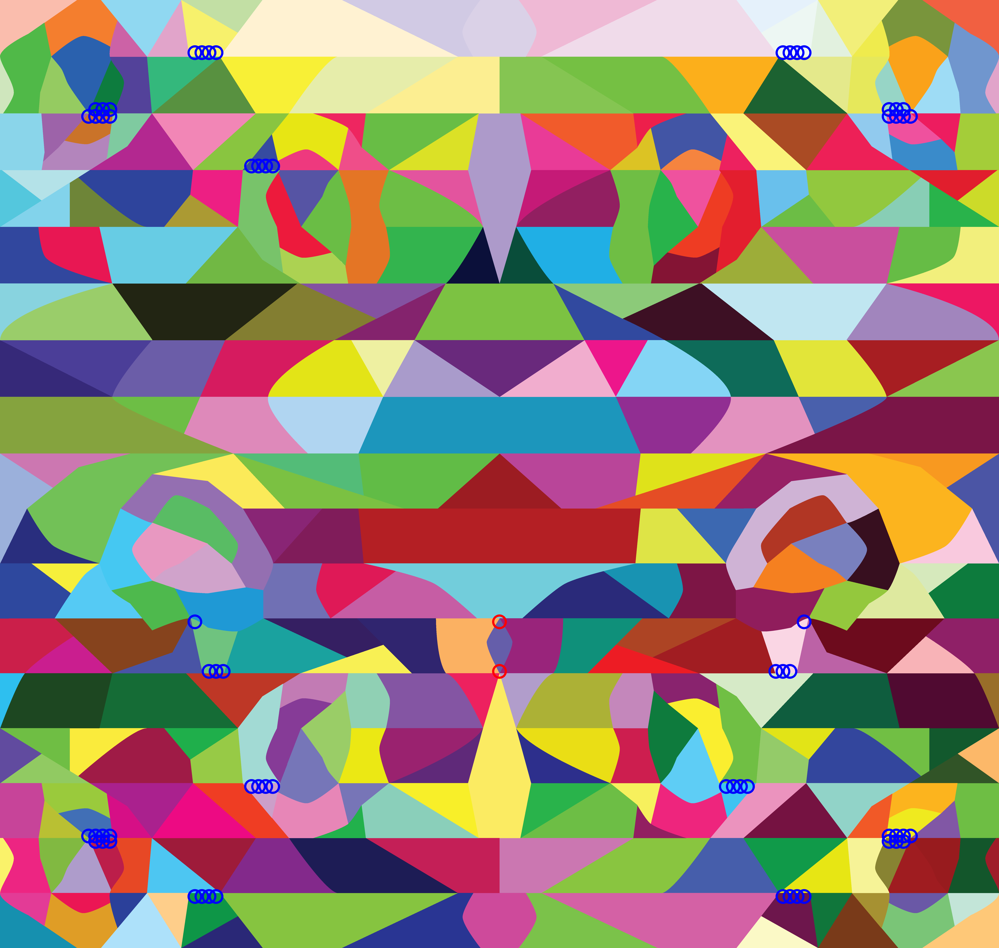

In [92]:
single_points = []
ids_values = [x for x in ids.values()]

for i, values in enumerate(ids.values()):
    if len(values) == 1:
        single_points.append(led_coord[values[0]])
        
leds = Image.new(design.mode, (design.width, design.height), color=(0,0,0,0))
draw = ImageDraw.Draw(leds)


# for x,y in led_coord:
#     draw.ellipse([x-20, y-20, x+20, y+20], fill=(0,0,0))
#     draw.ellipse([x-20, y-20, x+20, y+20], fill=(0,0,0))    

# for x,y in single_points:
#     draw.ellipse([x-50, y-50, x+50, y+50], outline="red", width=15)
#     draw.ellipse([x-20, y-20, x+20, y+20], outline="red") 

for i, values in enumerate(ids.values()):
    if len(values) > 4:
        continue
        
    for val in values:
        x, y = led_coord[val]
        col = "red" if len(values) <3 else "blue"
        draw.ellipse([x-50, y-50, x+50, y+50], outline=col, width=15)
    
display(Image.alpha_composite(design, leds))

In [27]:
lens = [len(x) for x in ids.values()]
print(sorted(lens))

[2, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 17, 17, 17, 17, 17, 17, 17, 17, 17, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 19, 19, 19, 19, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 22, 22, 22, 22, 22, 22, 22, 

Are there any excluded or duplicated pixels?

In [93]:
import itertools

pixels = sorted(list(itertools.chain.from_iterable(ids.values())))

for i in range(5100):
    if i not in pixels:
        print(i, " missing")
        
    if pixels.count(i) > 1:
        print(i, " duplicated")

Are any of the pixels suspiciously distant from other pixels in the poly? (This seems to happen in a few).

In [29]:
points

NameError: name 'points' is not defined

In [185]:
max(map(lambda x: abs(x-10), points))

5081

In [197]:
import matplotlib.pyplot as plt

In [202]:
cm = plt.get_cmap('Set2')

In [203]:
cm.colors

((0.4, 0.7607843137254902, 0.6470588235294118),
 (0.9882352941176471, 0.5529411764705883, 0.3843137254901961),
 (0.5529411764705883, 0.6274509803921569, 0.796078431372549),
 (0.9058823529411765, 0.5411764705882353, 0.7647058823529411),
 (0.6509803921568628, 0.8470588235294118, 0.32941176470588235),
 (1.0, 0.8509803921568627, 0.1843137254901961),
 (0.8980392156862745, 0.7686274509803922, 0.5803921568627451),
 (0.7019607843137254, 0.7019607843137254, 0.7019607843137254))

In [210]:
led_coord[2524]

(6040.457446808506, 3456.794117647059)

635
666
693
706
901
950
954
973
2417
3670


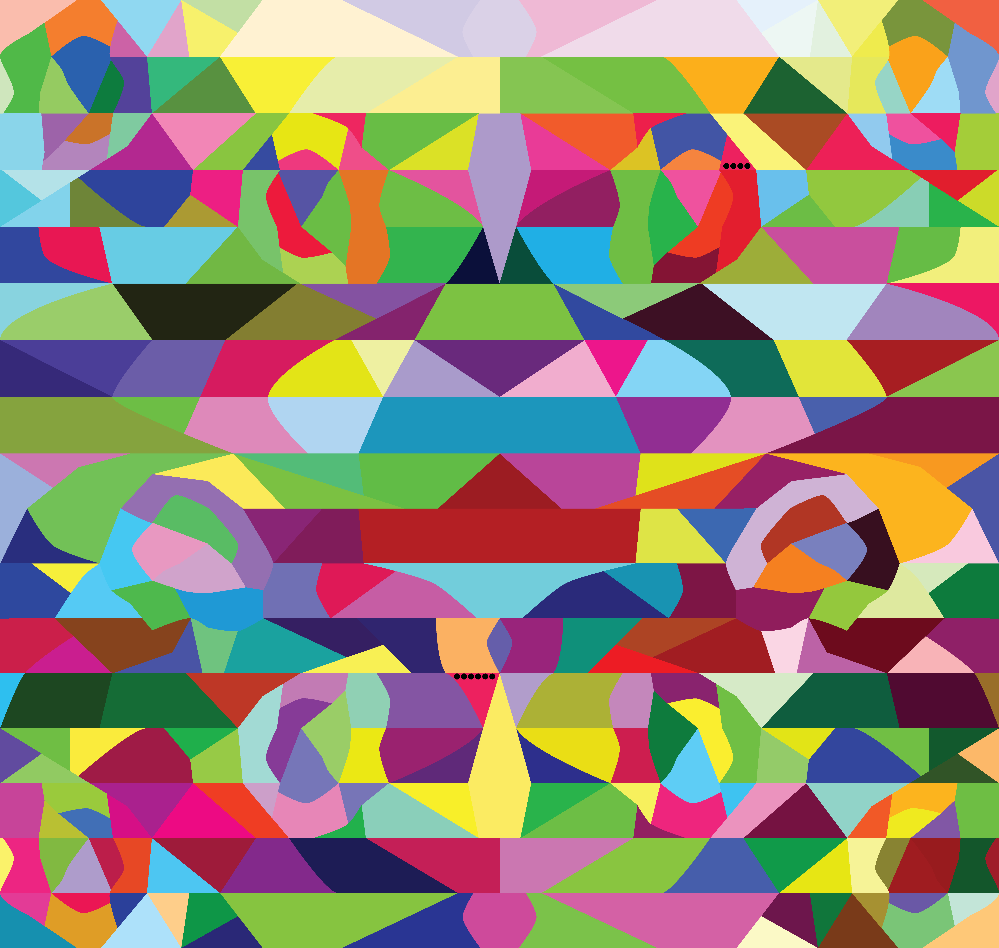

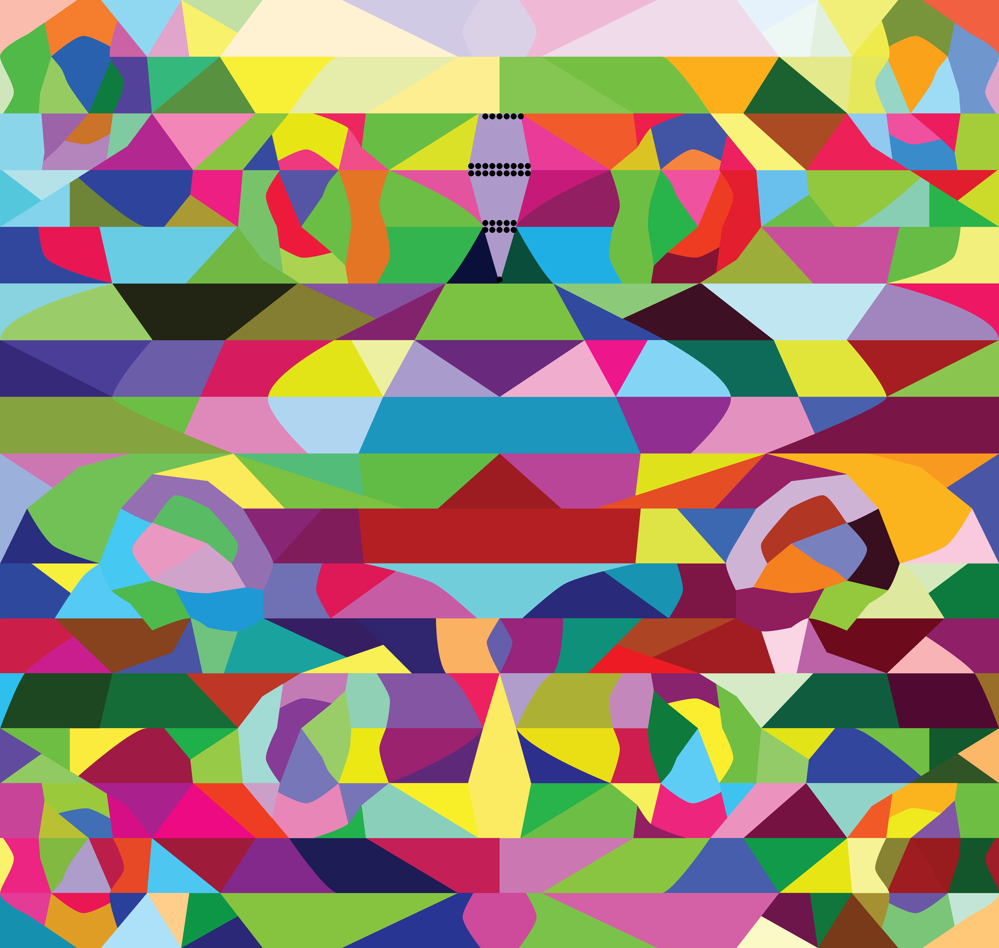

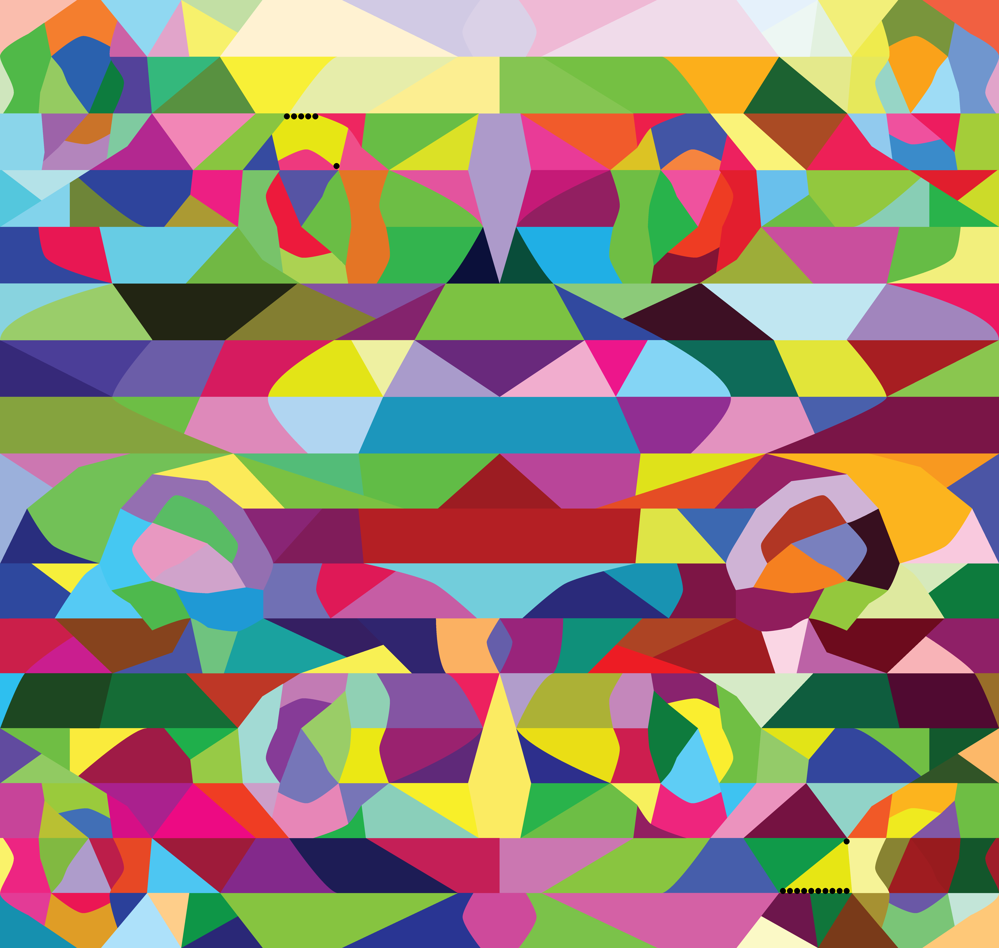

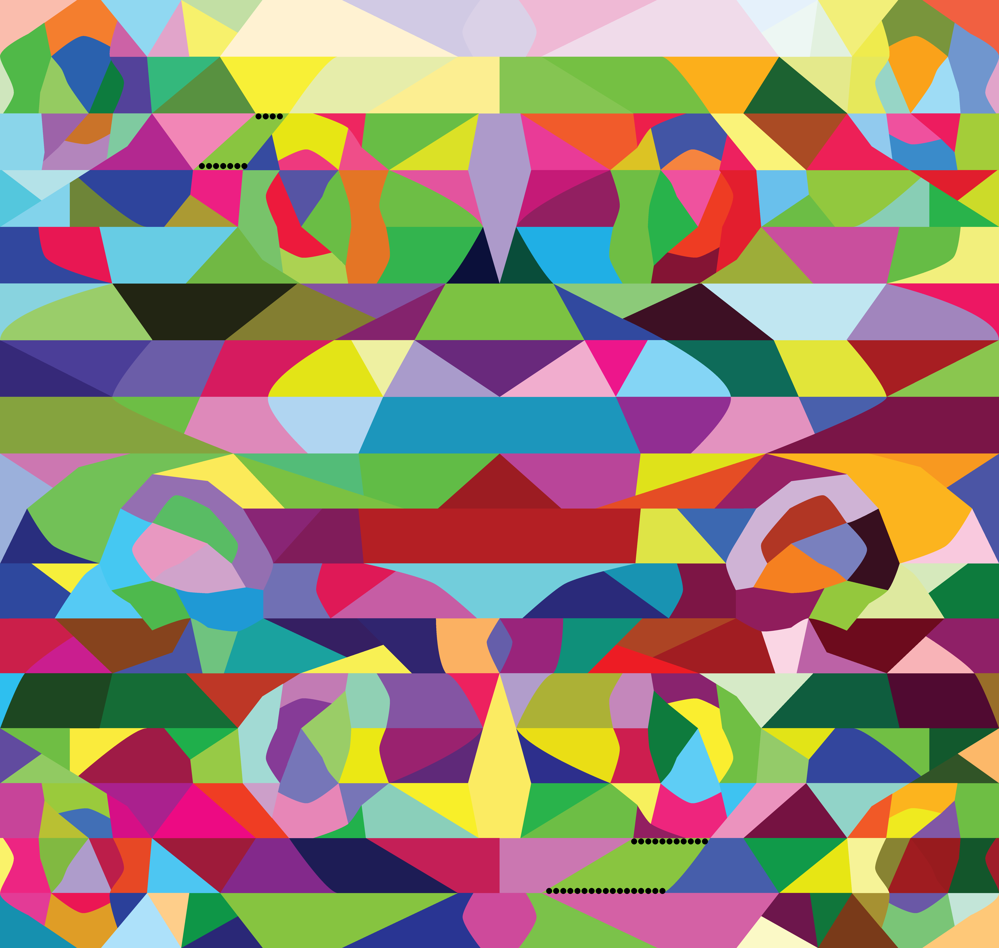

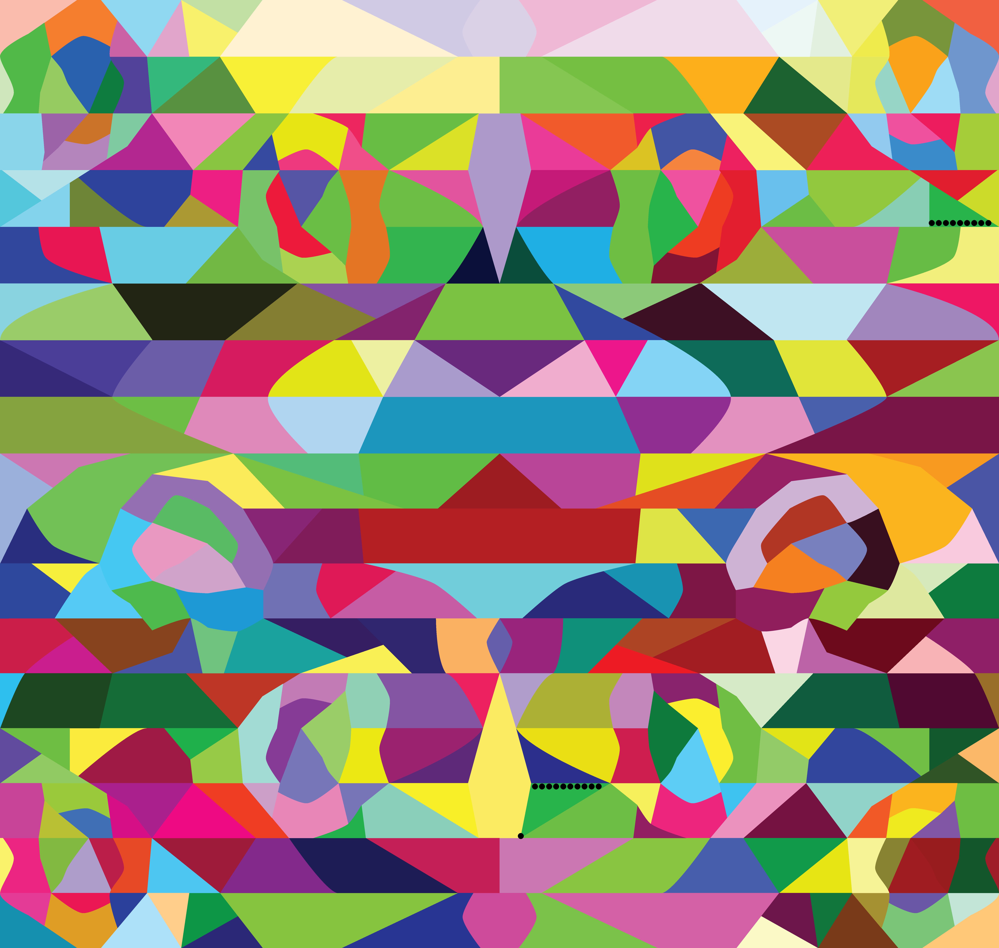

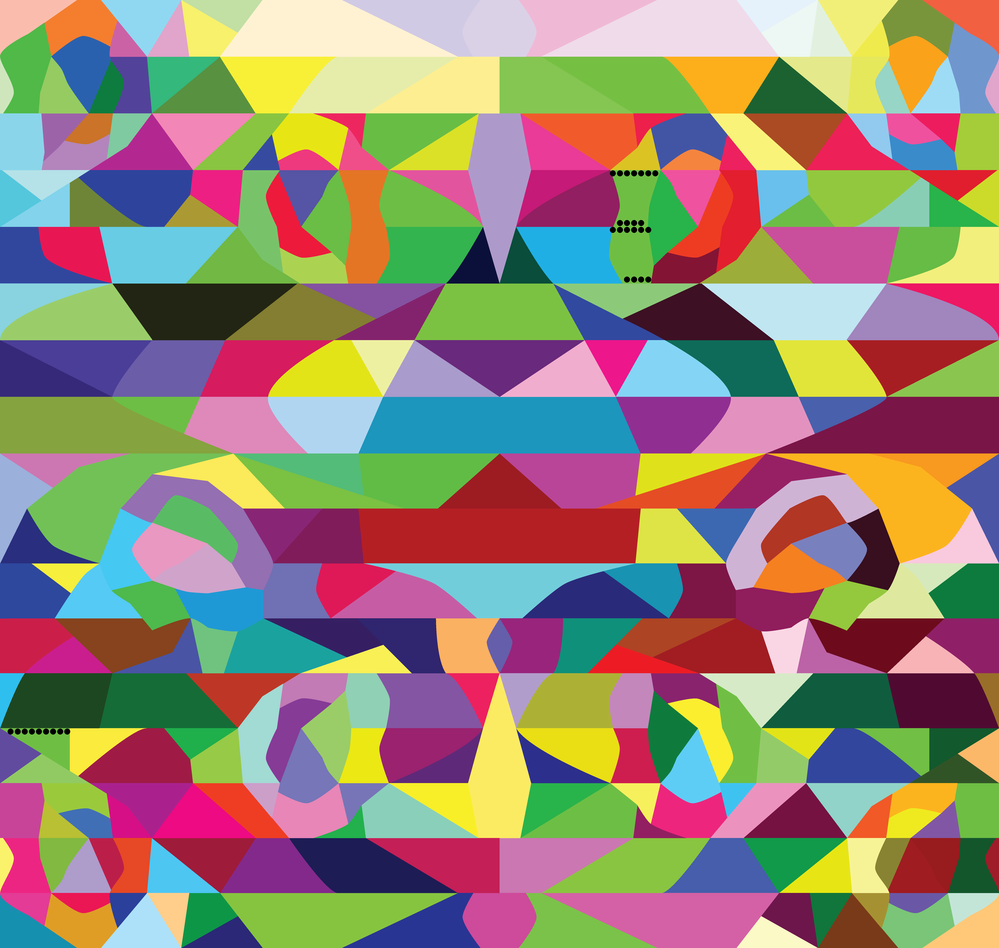

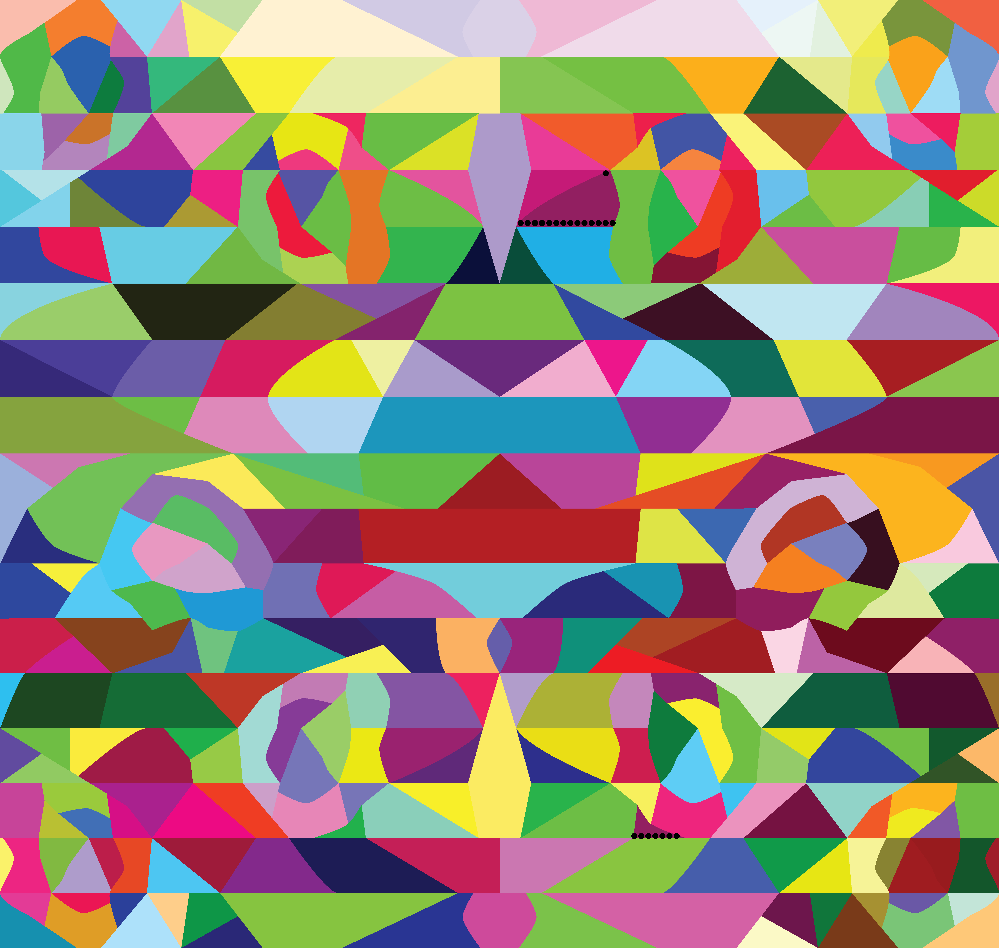

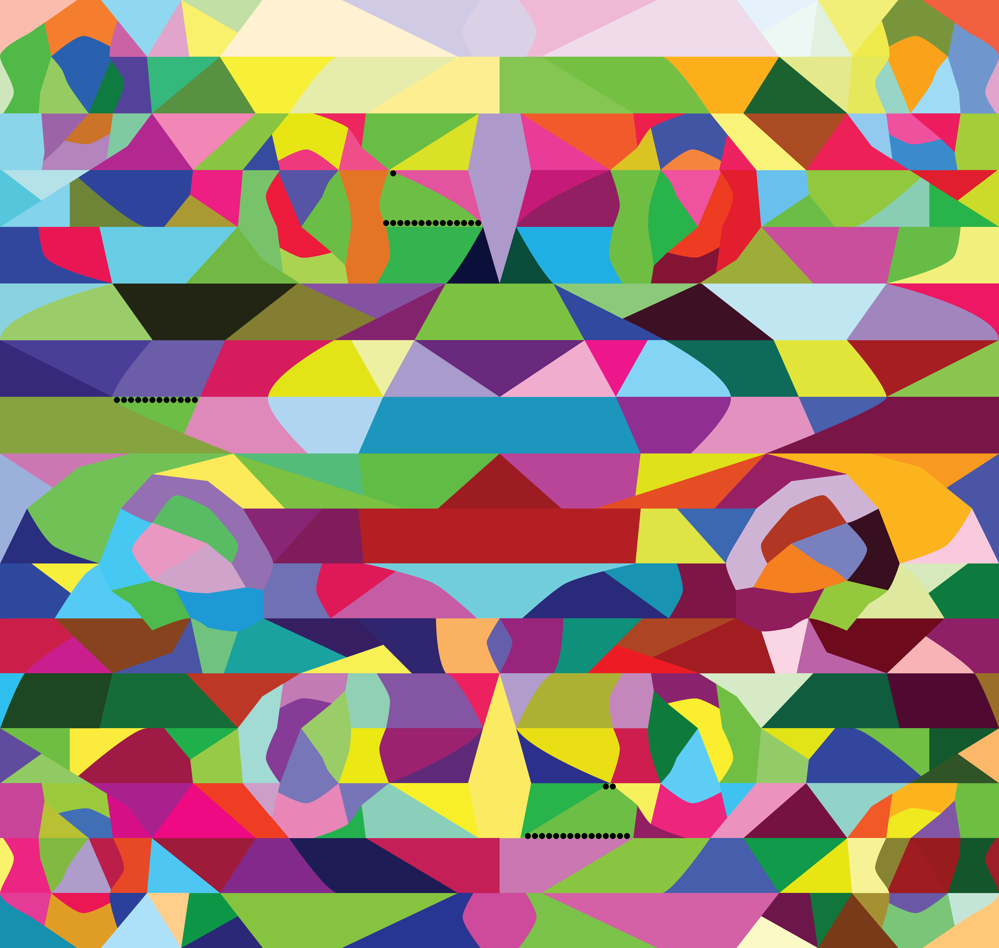

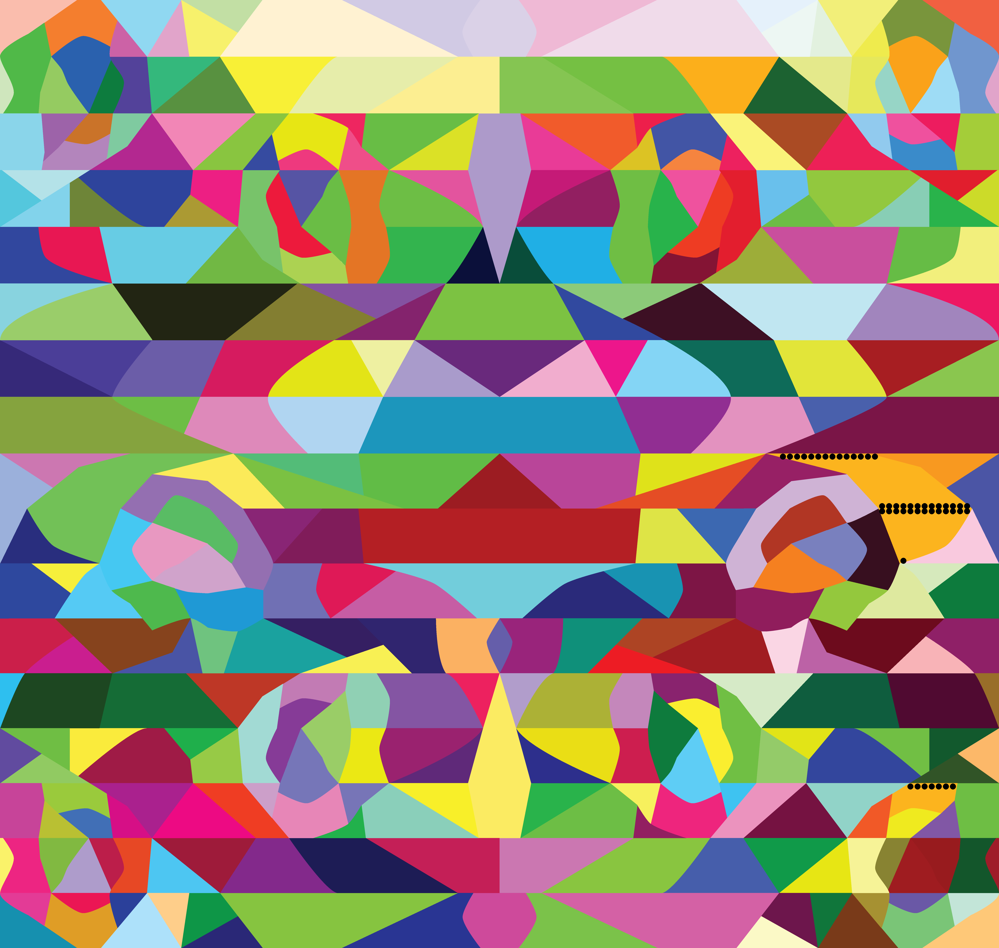

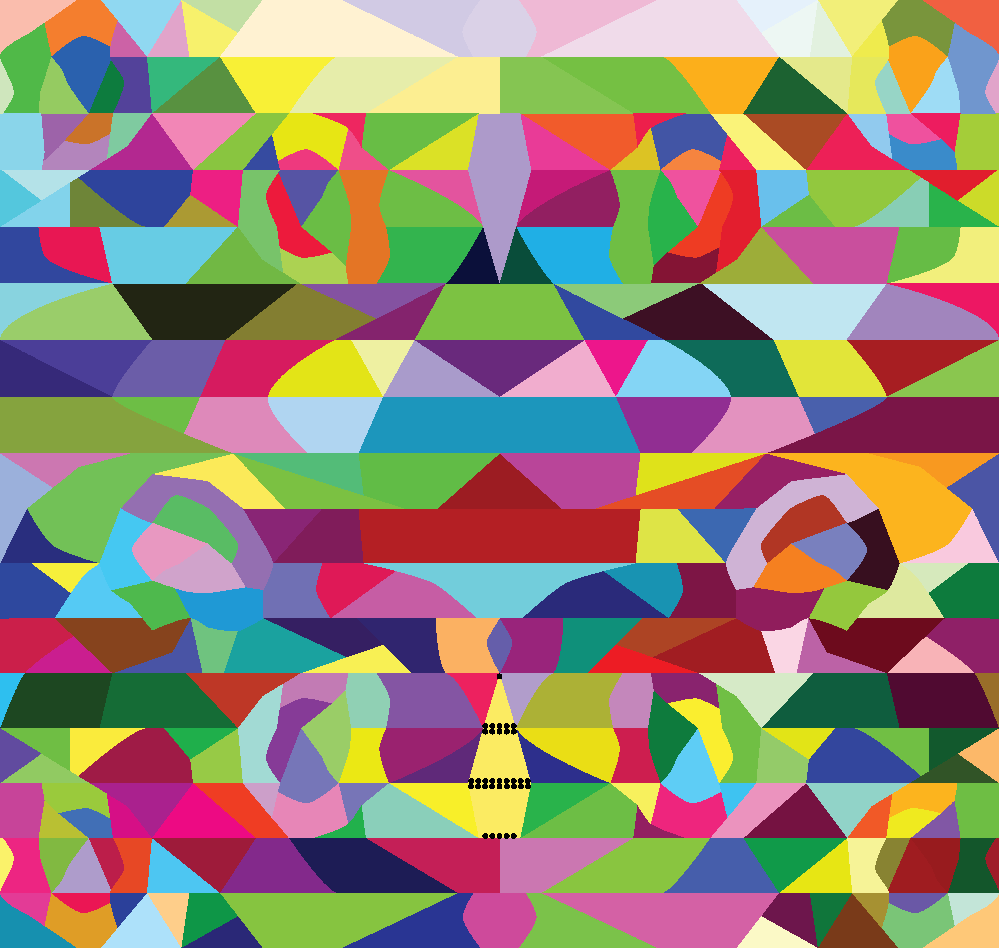

In [94]:
big = []
for poly, points in ids.items():
    if max(map(lambda x: abs(x-points[0]), points)) > 600:
        print(points[0])
        big.append(ids[poly])

cm = plt.get_cmap('Set2')
for i, poly in enumerate(big):
    leds = Image.new(design.mode, (design.width, design.height), color=(0,0,0,0))
    draw = ImageDraw.Draw(leds)
    color = tuple([int(x * 255) for x in cm.colors[i % len(cm.colors)]])

    for point in poly:
        x, y = led_coord[point]
        draw.ellipse([x-20, y-20, x+20, y+20], fill=(0,0,0))
    
    display(Image.alpha_composite(design, leds))
    

# Java constructs

In [34]:
# Emit java code encoding the polygons

for poly, points in enumerate(ids.values()):
    print("{" + ",".join([str(x) for x in points]) + "},")

{0,1,2,3,4,5,6,299,301,302,303,304,584,585,586,587,588,589,590,591},
{7,276,277,278,279,280},
{8,9,10,11,12,13,14,312,575,576,577,578,579,580,581,582},
{15,16,17,18,19},
{20,266,267,268,269,270,271,272,273,274,275},
{21,22,23,24,25,26,265},
{27,28,29,30},
{31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,242,243,244,245,246,247,248,249,250,251,252,253},
{63,64,65,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241},
{66,67,68,69,70,71,72,73,74,217,218,219,220,221,222,223},
{75,76,77,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216},
{78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,187,188,189,190,191,192,193,194,195,196,197,198},
{110,111,112,113},
{114,115,116,117,118,119,175,300,592,593,594,595,596,597,598,599},
{120,165,166,167,168,169,170,171,172,173,174},
{121,122,123,124,125},
{126,127,128,129,130,131,132,428,458,459,460,461,462,463,4

In [35]:
for poly, n in enumerate(neighbour_ids):
    print("{" + ",".join([str(x) for x in n]) + "},")

{40,23,70,1,13},
{0,22,4,2},
{23,70,25,3,1,69,24},
{2,4},
{5,25,26,3,1,2},
{6,4,26,21},
{7,5},
{6,8,21,29,28},
{30,7,9,29},
{31,30,10,8},
{31,11,9,32},
{33,10,20,12,32},
{11,13},
{35,0,20,12,14},
{16,36,35,17,15,13},
{14,16},
{64,36,38,17,37,15,63},
{16,18,19,14},
{38,17,62,39,63},
{17,18,16},
{33,35,11,13},
{5,7,26,28},
{2,0,1},
{70,2,0},
{2,3,25},
{2,26,3,24,68},
{43,5,25,28,27},
{5,6,7,26,28},
{44,43,7,26,29,47,67,27},
{30,67,7,49,28},
{31,51,7,8,9,29,49,50},
{30,52,53,11,10,51,9,32},
{33,31,53,11,66},
{35,59,11,55,58,32,66,34},
{33,35,11,12,13},
{36,60,33,59,34,13},
{16,35,37,15,65},
{36,16,15},
{63,16,18},
{18},
{0,41,23,70,98,13},
{40,23,42,24,2},
{43,41,74,25,26,68,24,27},
{44,77,42,74,76,27},
{43,45,77,79,47,27},
{44,227,228,46,250,28,27},
{45,29,47,28},
{44,67,46,79,29,48},
{30,49,29,47},
{81,30,97,51,67,48,50},
{49,30,51},
{117,31,30,82,97,106,105,52,96,107,104,83,49,50},
{31,53,51},
{31,84,52,96,54,51,66},
{31,53,55,32},
{263,86,264,291,311,54,293,58,32,66,292,56},
{33,57,55

# Locate IDs of specific designs in the main design

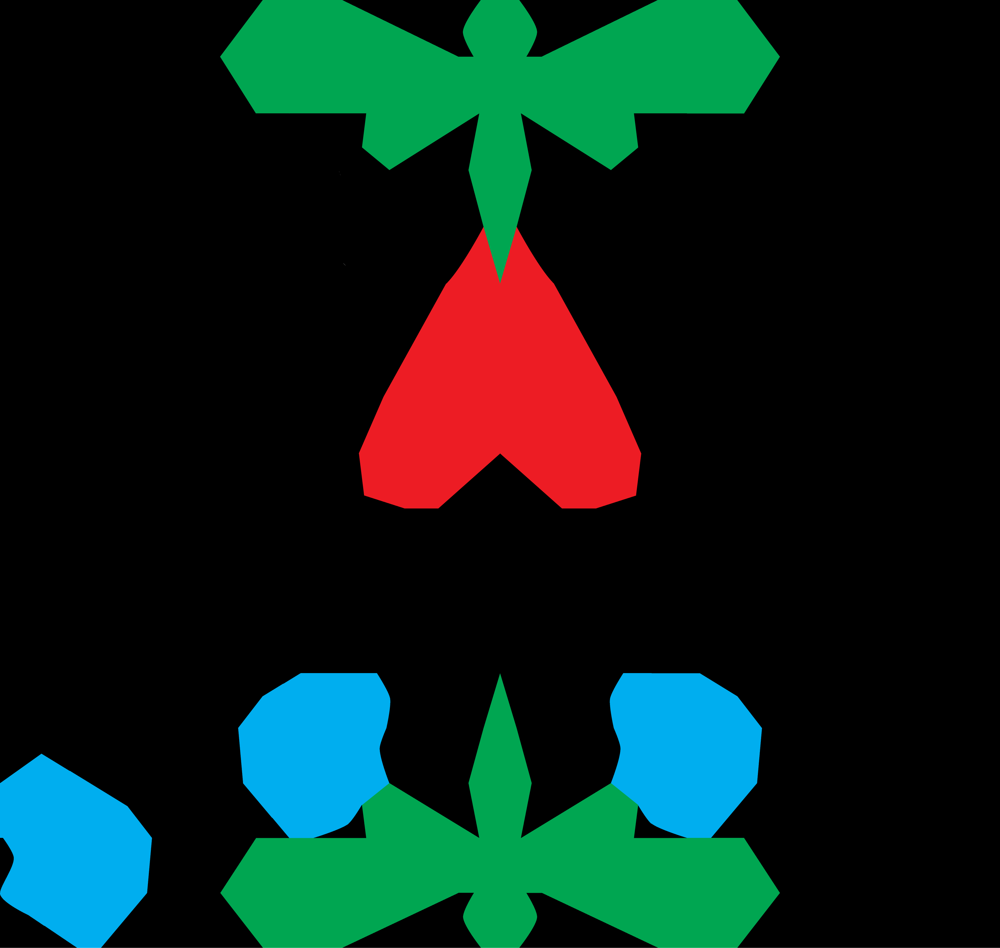

In [30]:
sprites = Image.open("../assets/glass/sprite-ids.png")
display(sprites)

In [36]:
# Copy-paste coding from above because we're lazy
# Determine unique IDs for the 

sprite_ids = {}

for i, (x,y) in enumerate(led_coord):
    
    color = sprites.getpixel((x * sprites.width / w, y * sprites.height / h))
    if color not in sprite_ids:
        sprite_ids[color] = list()
    
    sprite_ids[color].append(i)

In [37]:
# For each sprite we locate, convert to the poly ID on the main design

led_polys = dict()
for i, (poly, leds) in enumerate(ids.items()):
    for led in leds:
        led_polys[led] = i

sprite_polys = {}
for sprite, leds in sprite_ids.items():
    sprite_polys[sprite] = set()
    for led in leds:
        sprite_polys[sprite].add(led_polys[led])

In [38]:
sprite_polys

{(0, 0, 0, 255): {0,
  1,
  2,
  3,
  4,
  5,
  6,
  8,
  10,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  50,
  52,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  69,
  70,
  71,
  72,
  73,
  74,
  75,
  76,
  77,
  78,
  79,
  80,
  81,
  82,
  83,
  84,
  85,
  86,
  87,
  88,
  89,
  90,
  91,
  92,
  93,
  94,
  95,
  96,
  97,
  98,
  99,
  100,
  101,
  102,
  103,
  104,
  107,
  108,
  109,
  110,
  111,
  112,
  113,
  114,
  115,
  116,
  118,
  119,
  120,
  121,
  122,
  123,
  124,
  125,
  126,
  127,
  128,
  129,
  130,
  134,
  135,
  136,
  137,
  138,
  139,
  140,
  141,
  142,
  143,
  145,
  146,
  147,
  148,
  149,
  150,
  151,
  152,
  153,
  154,
  156,
  158,
  159,
  160,
  161,
  162,
  163,
  164,
  165,
  166,
  167,
  168,
  169,
  170,
  171,
  172,
  173,
  174,
  

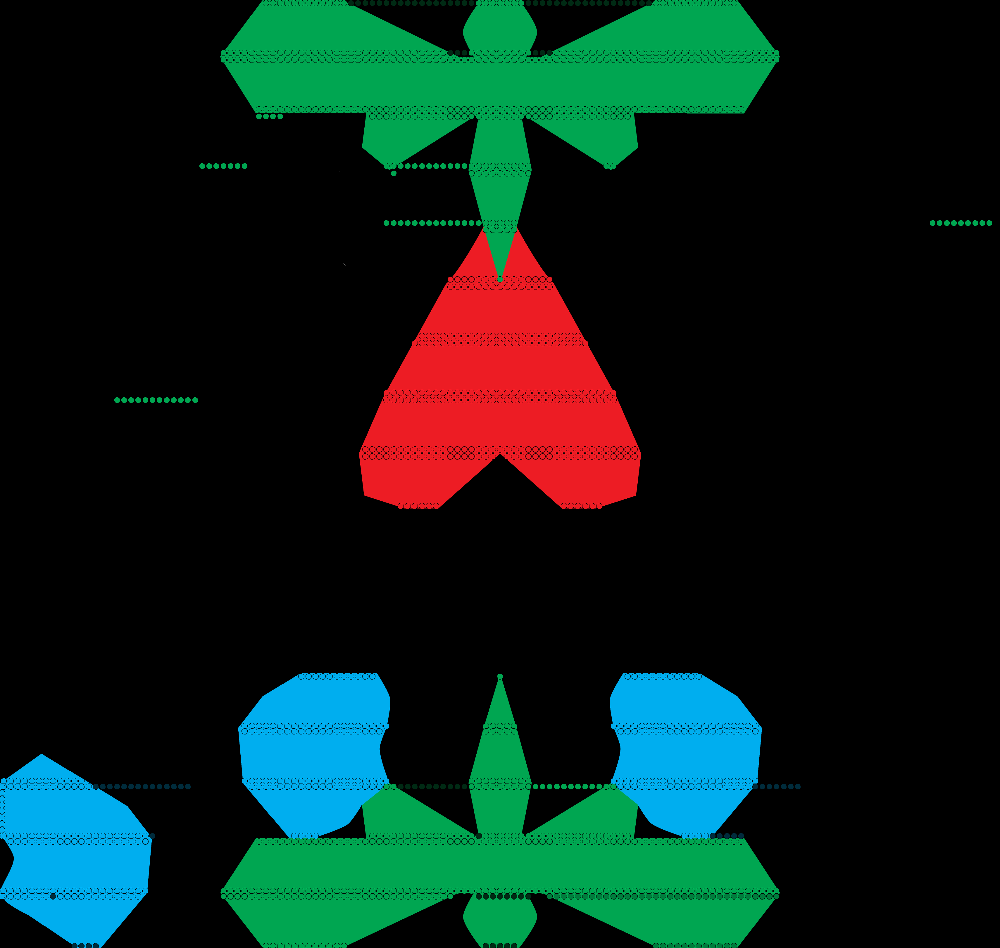

In [50]:

cm = plt.get_cmap('Set2')

leds = Image.new(sprites.mode, (sprites.width, sprites.height), color=(0,0,0,0))
draw = ImageDraw.Draw(leds)
color = tuple([int(x * 255) for x in cm.colors[i % len(cm.colors)]])

for color, polys in sprite_polys.items():
    if color == (0,0,0,255):
        continue
        
    for poly in polys:
        for point in list(ids.values())[poly]:
            x, y = led_coord[point]
            x *= sprites.width / w
            y *= sprites.height / h
            draw.ellipse([x-10, y-10, x+10, y+10], fill=color, outline=(0,0,0))

display(Image.alpha_composite(sprites, leds))
    